In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [2]:
IMAGE_SIZE = 256
CHANNELS = 3
BATCH_SIZE = 16
Epochs = 25

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory("/kaggle/input/disease-detection/PlantVillage",
                                                              shuffle=True,
                                                              image_size=(IMAGE_SIZE,IMAGE_SIZE),
                                                                 batch_size=BATCH_SIZE)

Found 2152 files belonging to 3 classes.


In [4]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [5]:
for image_batch, label_batch in dataset.take(1):
    print("Image batch shape:", image_batch.shape) # 3 represents the RGB channels
    print("Label batch array:", label_batch.numpy()) # 0,1,2 are the classes names
    print("Image array:", image_batch[0]) # It is a tensor with RGB

Image batch shape: (16, 256, 256, 3)
Label batch array: [1 1 0 1 1 1 0 0 1 0 0 1 1 0 0 0]
Image array: tf.Tensor(
[[[143. 137. 151.]
  [144. 138. 152.]
  [146. 140. 154.]
  ...
  [142. 136. 150.]
  [142. 136. 150.]
  [132. 126. 140.]]

 [[146. 140. 154.]
  [147. 141. 155.]
  [148. 142. 156.]
  ...
  [136. 130. 144.]
  [139. 133. 147.]
  [137. 131. 145.]]

 [[149. 143. 157.]
  [150. 144. 158.]
  [151. 145. 159.]
  ...
  [126. 120. 134.]
  [132. 126. 140.]
  [138. 132. 146.]]

 ...

 [[144. 138. 152.]
  [141. 135. 149.]
  [136. 130. 144.]
  ...
  [109. 104. 124.]
  [107. 102. 122.]
  [103.  98. 118.]]

 [[143. 137. 151.]
  [140. 134. 148.]
  [137. 131. 145.]
  ...
  [109. 104. 124.]
  [109. 104. 124.]
  [105. 100. 120.]]

 [[143. 137. 151.]
  [142. 136. 150.]
  [140. 134. 148.]
  ...
  [109. 104. 124.]
  [109. 104. 124.]
  [105. 100. 120.]]], shape=(256, 256, 3), dtype=float32)


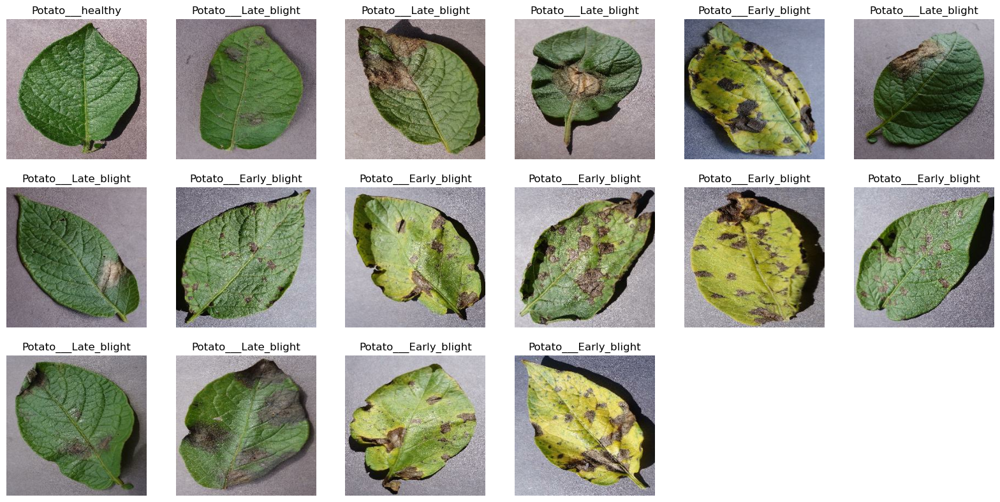

In [6]:
plt.figure(figsize=(20,20))
for image_batch, label_batch in dataset.take(1):
    for i in range(BATCH_SIZE):
        plt.subplot(6,6,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

In [7]:
def get_dataset_partition_tf (ds , train_split=0.8 , val_split = 0.1, test_split=0.1,shuffle = True , shuffle_size = 10000):
    ds_size = len(ds)
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed = 12)
    train_size = int(ds_size*train_split)
    val_size = int(ds_size*val_split)
    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [8]:
train_ds , val_ds, test_ds = get_dataset_partition_tf(dataset)
len(train_ds)

108

In [9]:
# cache will keep the data in memory for the next iteration 
#prefetch will use cpu to keep next batch of data ready while gpu is training, autotune will take data by itself 
train_ds = train_ds.shuffle(1000)
val_ds = val_ds.shuffle(1000) 
test_ds = test_ds.shuffle(1000)

In [10]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1.0/255)
])

In [11]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2)
])

In [12]:
input_shape = (BATCH_SIZE,IMAGE_SIZE,IMAGE_SIZE, CHANNELS)
n_classes=len(class_names)
model =models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32,(3,3), activation="relu",input_shape = input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3), activation="relu"),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation="relu"),
    layers.Dense(n_classes , activation = "softmax")

])
model.build(input_shape = input_shape)

In [13]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (16, 256, 256, 3)         0         
                                                                 
 sequential_1 (Sequential)   (16, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (16, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (16, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (16, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (16, 62, 62, 64)         0         
 2D)                                                  

In [14]:
model.compile(optimizer="adam",
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=["accuracy"])

In [15]:
history = model.fit(train_ds,epochs=Epochs,batch_size=BATCH_SIZE,verbose=1 , validation_data=val_ds)

Epoch 1/25
108/108 [==============================] - 28s 63ms/step - loss: 0.8498 - accuracy: 0.5382 - val_loss: 0.6513 - val_accuracy: 0.7600
Epoch 2/25
108/108 [==============================] - 9s 63ms/step - loss: 0.6742 - accuracy: 0.6866 - val_loss: 0.6560 - val_accuracy: 0.7788
Epoch 3/25
108/108 [==============================] - 9s 58ms/step - loss: 0.4759 - accuracy: 0.7930 - val_loss: 0.3984 - val_accuracy: 0.8125
Epoch 4/25
108/108 [==============================] - 9s 58ms/step - loss: 0.2957 - accuracy: 0.8814 - val_loss: 0.3730 - val_accuracy: 0.8558
Epoch 5/25
108/108 [==============================] - 9s 56ms/step - loss: 0.2855 - accuracy: 0.8878 - val_loss: 0.2602 - val_accuracy: 0.9038
Epoch 6/25
108/108 [==============================] - 8s 53ms/step - loss: 0.1755 - accuracy: 0.9311 - val_loss: 0.0822 - val_accuracy: 0.9600
Epoch 7/25
108/108 [==============================] - 9s 59ms/step - loss: 0.1929 - accuracy: 0.9233 - val_loss: 0.1445 - val_accuracy: 0.937

In [16]:
scores = model.evaluate(test_ds)

14/14 [==============================] - 3s 21ms/step - loss: 0.1944 - accuracy: 0.9464


In [17]:
history.params

{'verbose': 1, 'epochs': 25, 'steps': 108}

In [18]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [19]:
accuracy = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

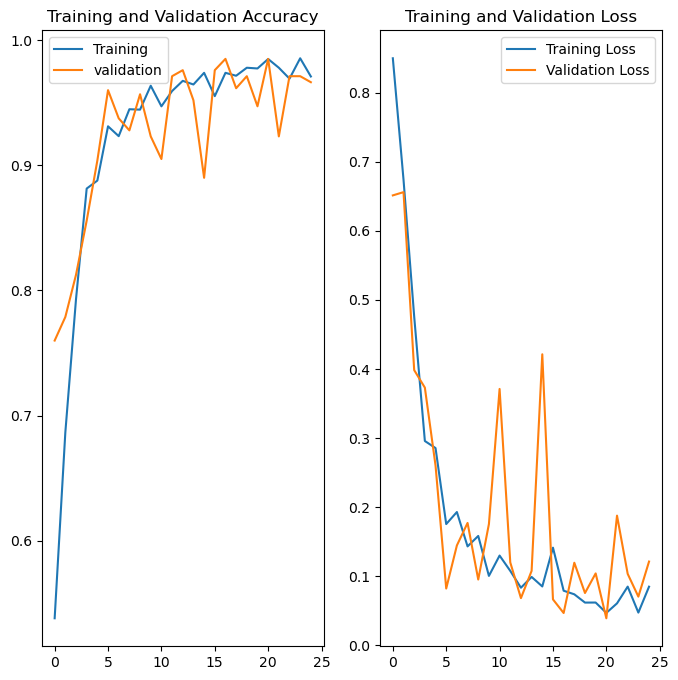

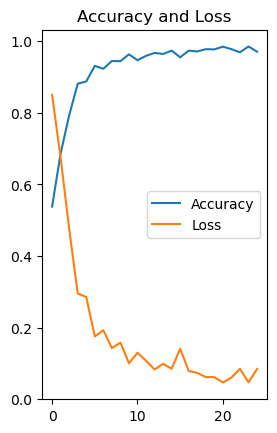

In [22]:
plt.figure(figsize = (8,8))
plt.subplot(1,2,1)
plt.plot(range(Epochs) , accuracy , label= "Training ")
plt.plot(range(Epochs) , val_acc , label= "validation")
plt.legend()
plt.title("Training and Validation Accuracy")

plt.subplot(1, 2, 2)
plt.plot(range(Epochs), loss, label='Training Loss')
plt.plot(range(Epochs), val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

plt.subplot(1, 2, 2)
plt.plot(range(Epochs), accuracy, label='Accuracy')
plt.plot(range(Epochs), loss, label='Loss')
plt.legend()
plt.title('Accuracy and Loss')
plt.show()

1/1 [==============================] - 0s 169ms/step
actual label: Potato___Late_blight
predicted label: Potato___Late_blight


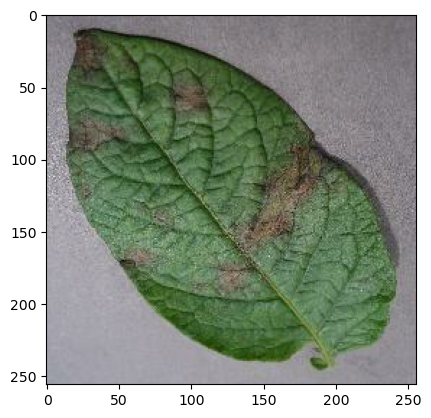

In [23]:
for images_batch , labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype("uint8")
    first_label = class_names[labels_batch[0].numpy()]
    plt.imshow(first_image)
    batch_prediction = model.predict(images_batch)
    predicted_label = class_names[np.argmax(batch_prediction[0])]
    print(f"actual label: {first_label}")
    print(f"predicted label: {predicted_label}")
    

In [24]:
def predict_using_model (model, image):
    image_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    image_array = tf.expand_dims(image_array , 0)
    prediction = model.predict(image_array)
    predicted_class = class_names[np.argmax(prediction[0])]
    confidence = round(100*(np.max(prediction[0])),2)
    return predicted_class , confidence

1/1 [==============================] - 0s 20ms/step


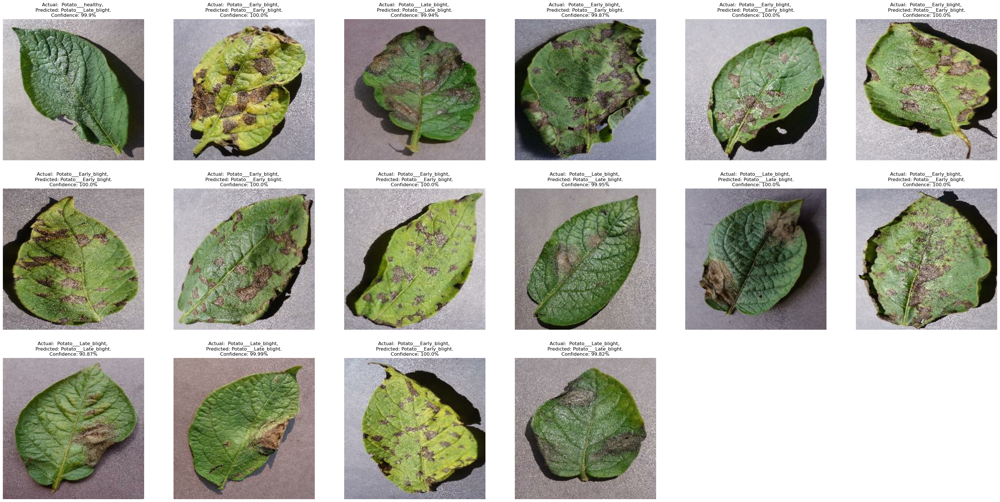

In [26]:
plt.figure(figsize = (45,45))
for images , labels in test_ds.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(6,6,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class , confidence = predict_using_model(model , images[i].numpy())
        actual_class = class_names[labels[i]]
        plt.title(f"Actual:  {actual_class}, \n Predicted: {predicted_class}. \n Confidence: {confidence}% ")
        plt.axis("off")

In [28]:
model.save("/kaggle/working/potato_model.h5")